In [41]:
import numpy as np
import pandas as pd

import os, glob, re, scipy.io
import matplotlib.pyplot as plt

from keras.preprocessing import image
from keras.models import Model

class GetStandfordCars:
    """
    
    
    """
    
    def __init__(self, loc="../Data/car_ims/", labels_matlab_file ="../Data/cars_annos.mat"):
        
        self.car_images_location = loc
        self.labels_mat = scipy.io.loadmat(labels_matlab_file)
        
        # --- class names
        self.number_of_classes = len(self.labels_mat['class_names'][0])
        self.class_names = [str(self.labels_mat['class_names'][0][i][0]) for i in range(self.number_of_classes)]
        
        
        self.max_pics = 16185
        
        self.annot_df = self.create_annot_df()
        self.class_names_df = self.create_class_df()
        
        # --- for future
        #  Code to check if the 'loc' is a valid dataset
        #  if not, download data and unzip
        #  same for the labels matlab file
        
    
    def bring_annot(self, fileName):
        """
        """
        
        if type(fileName) == str:
            numb = int(re.sub(r'[^0-9]', '', fileName))
        else:
            numb = int(fileName)

        return ((self.labels_mat['annotations'][0][numb-1]))  
    
    
    def bringup_ClassLabel(self, fileName):
        if type(fileName) == str:
            numb = int(re.sub(r'[^0-9]', '', fileName))
        else:
            numb = int(fileName)

        #print("Class of image {}: {}".format(fileName, class_labels[int(mat['annotations'][0][numb-1][5])-1][0]))
        return self.class_names[int(self.labels_mat['annotations'][0][numb-1][5])-1]

        
    def bring_AnnotList(self, fileName):
        """
        """
        
        if type(fileName) == str:
            numb = int(re.sub(r'[^0-9]', '', fileName))
        else:
            numb = int(fileName)
        
        annot_array = self.bring_annot(numb)
        xmin = annot_array[1][0][0]
        ymin = annot_array[2][0][0]
        xmax = annot_array[3][0][0]
        ymax = annot_array[4][0][0]
        class_no = annot_array[5][0][0]
        class_label = self.bringup_ClassLabel(numb)
        train_test = annot_array[6][0][0]
        
        # --- file number, xmin, ymin, xmax, ymax, class no, train(0)/test(1)
        annot = [numb, xmin, ymin, xmax, ymax, class_no, class_label, train_test]

        return annot  
    
    def create_annot_df(self):
        
        list_df = []
        
        for fileName in range(1, self.max_pics + 1):
            list_df.append(self.bring_AnnotList(fileName))
            
        cols = ["fileNumber", "xmin", "ymin", "xmax", "ymax", "class_no", "class_label", "train_test"]
        
        return pd.DataFrame(list_df, columns = cols)
    
    def create_class_df(self):
        pass
    
    def getImages_by_class(self):
        pass
    
    def show_annots(self, fileName):
        """
        """

        if type(fileName) == str:
            numb = int(re.sub(r'[^0-9]', '', fileName))
        else:
            numb = int(fileName)

        print("Annot:     "+str(cars.labels_mat['annotations'][0][numb-1]))
        print("File Name: "+str(cars.labels_mat['annotations'][0][numb-1][0][0]))
        print("x min:     "+str(cars.labels_mat['annotations'][0][numb-1][1][0][0]))
        print("y min:     "+str(cars.labels_mat['annotations'][0][numb-1][2][0][0]))
        print("x max:     "+str(cars.labels_mat['annotations'][0][numb-1][3][0][0]))
        print("y max:     "+str(cars.labels_mat['annotations'][0][numb-1][4][0][0]))
        print("class no:  "+str(cars.labels_mat['annotations'][0][numb-1][5][0][0]))
        print("Train(0)/Test(1): "+str(cars.labels_mat['annotations'][0][numb-1][6][0][0]))

    
    def getPath(self, number):
        fileName  = str('0') * int(6 - len(str(number)))
        fileName += str(number)+".jpg"
        return (self.car_images_location + fileName)

    
    def getImgArray(self, number, target_size=(224, 224) ):
        img_path =  self.getPath(number)
        img = image.load_img(img_path, target_size=target_size)
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        
        return x
    

    def getNextImgArray(self, target_size=(224, 224) ):
        count = 0
        
        while count<self.max_pics:
            count += 1        
        
            yield (count, self.getImgArray(count, target_size))
    

    def showRandomNxN(self, N):
        '''
        Function to plot the MNIST data on a grid of NxN
        '''
        plt.rcParams['figure.figsize'] = [30, 30]

        listofRand = np.random.randint(1, self.max_pics + 1, size=int(N*N))

        image_size = (128, 128)

        fig = plt.figure()

        for i in range(0, N*N):
            img = image.load_img(self.getPath(listofRand[i]), target_size=image_size)
            ax = fig.add_subplot(N, N, i+1)
            imgplot = ax.imshow(img)
            ax.set_title(self.bringup_ClassLabel(listofRand[i]))
            ax.grid(False)
            ax.set_xticks([])
            ax.set_yticks([])

        plt.show();
    
    
    def show_classNxN(self, class_no = 20, N=4):
        '''
        Function to plot image data on a grid of NxN
        '''
        plt.rcParams['figure.figsize'] = [30, 30]
        
        list_of_images = list(self.annot_df.loc[self.annot_df["class_no"] == class_no]["fileNumber"])

        listofRand = np.random.choice(list_of_images, size = N*N, replace=False)

        image_size = (128, 128)

        fig = plt.figure()

        for i in range(0, N*N):
            img = image.load_img(self.getPath(listofRand[i]), target_size=image_size)
            ax = fig.add_subplot(N, N, i+1)
            imgplot = ax.imshow(img)
            ax.set_title(self.bringup_ClassLabel(listofRand[i]))
            ax.grid(False)
            ax.set_xticks([])
            ax.set_yticks([])

        plt.show();
        
    def show_1EachClass7x7(self, quarter = 1):
        '''
        Function to plot image data on a grid of NxN
        '''
        assert quarter <= 4
        
        plt.rcParams['figure.figsize'] = [30, 30]
        
        fig = plt.figure()
        
        for class_no in range((quarter-1)*49, quarter*49):
            
            list_of_images = list(self.annot_df.loc[self.annot_df["class_no"] == class_no + 1]["fileNumber"])
            listofRand = np.random.choice(list_of_images, size = 1, replace=False)
            image_size = (128, 128)

            
            img = image.load_img(self.getPath(listofRand[0]), target_size=image_size)
            ax = fig.add_subplot(7, 7, class_no + 1 - (quarter-1)*49)
            imgplot = ax.imshow(img)
            ax.set_title("Class "+str(class_no+1)+ " " + self.bringup_ClassLabel(listofRand[0]))
            ax.grid(False)
            ax.set_xticks([])
            ax.set_yticks([])

        plt.show();

In [4]:
#from stanford_cars import *
#from get_pretrained_features import *

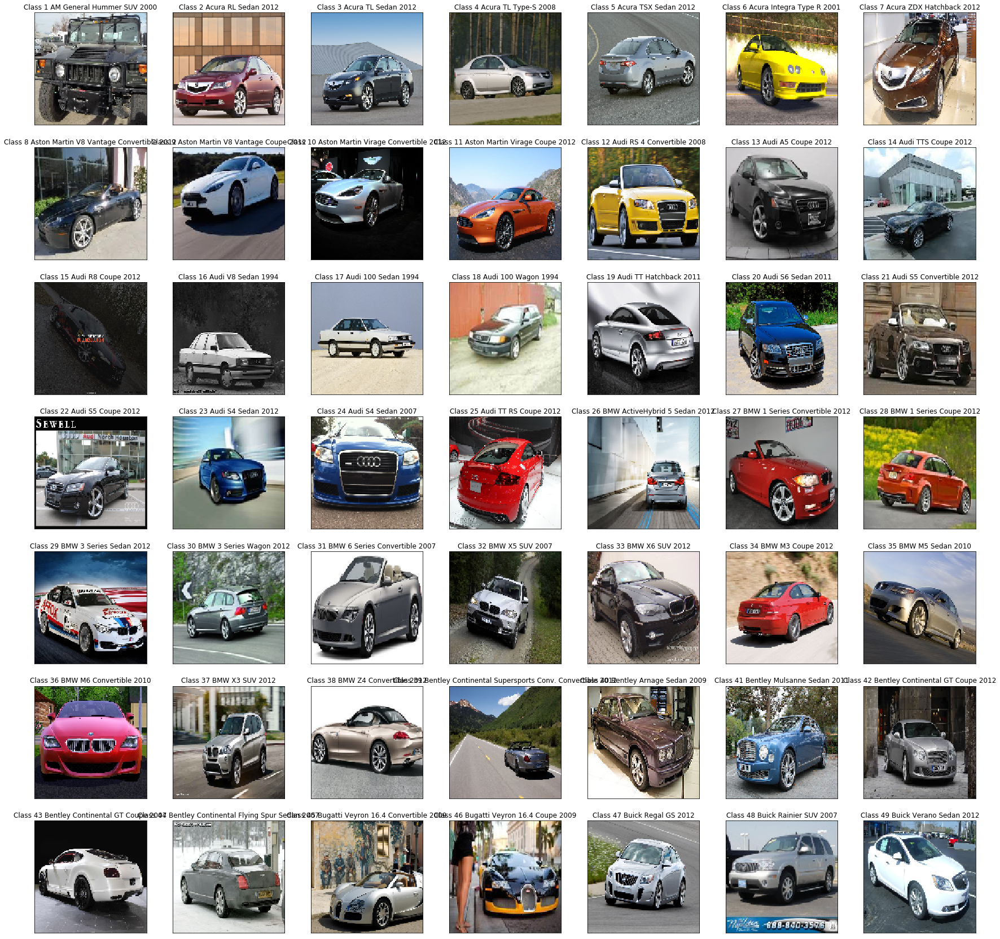

In [43]:
cars = GetStandfordCars()

#cars.show_classNxN(class_no=71)
cars.show_1EachClass7x7(quarter = 1)
#cars.annot_df[cars.annot_df[c]]

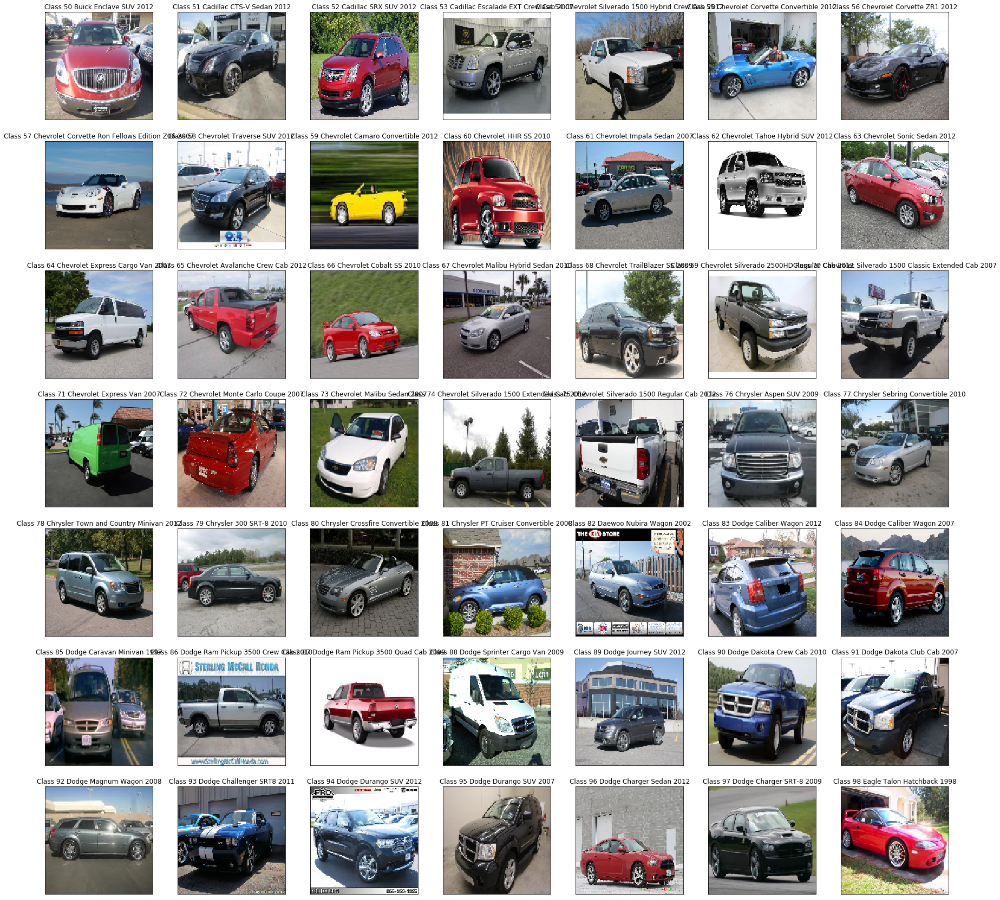

In [44]:
cars.show_1EachClass7x7(quarter = 2)

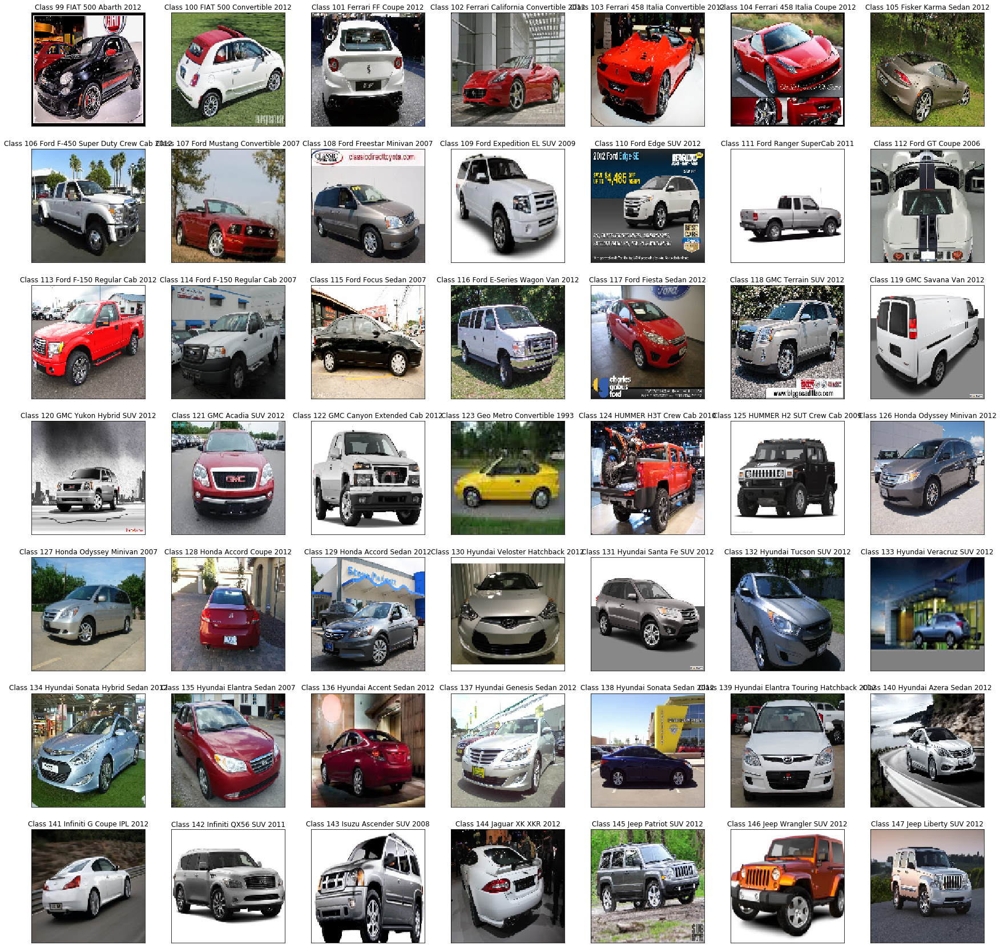

In [45]:
cars.show_1EachClass7x7(quarter = 3)

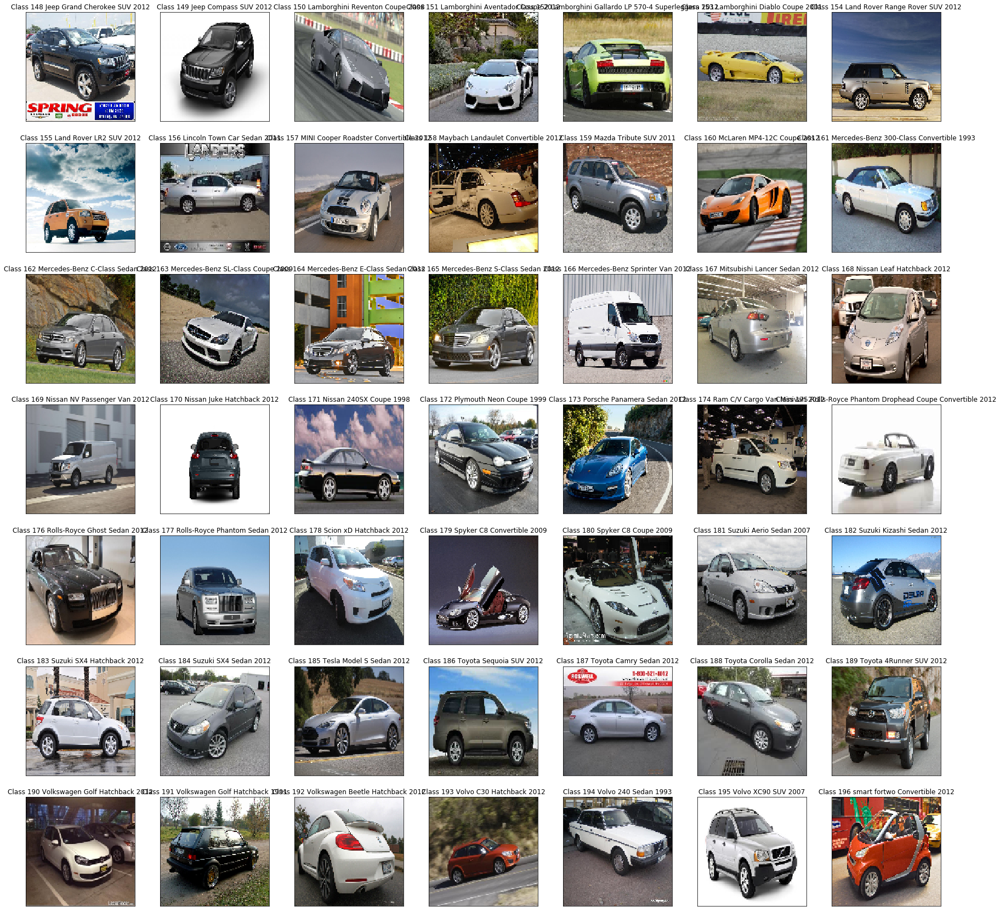

In [46]:
cars.show_1EachClass7x7(quarter = 4)

In [47]:
car_types = {
    "Sedan": [0, []],
    "Coupe": [0, []],
    "SUV": [0, []],
    "Hatchback": [0, []],
    "Convertible": [0, []],
    "Misc.": [0, []]   
}

categories = ["Sedan", "Coupe", "SUV", "Hatchback", "Convertible", "Misc."]
found_cat = [0] * cars.number_of_classes
for idx, car in enumerate(cars.class_names):
    for cat in categories:
        if cat in car:
            car_types[cat][0] += 1
            car_types[cat][1].append(idx+1)
            found_cat[idx] = 1
            break
    if found_cat[idx] ==0:
        car_types["Misc."][0] += 1
        car_types["Misc."][1].append(idx+1)
        found_cat[idx] = 1

In [48]:
print(car_types)

{'Sedan': [46, [2, 3, 5, 16, 17, 20, 23, 24, 26, 29, 35, 40, 41, 44, 49, 51, 61, 63, 67, 73, 96, 105, 115, 117, 129, 134, 135, 136, 137, 138, 140, 156, 162, 164, 165, 167, 173, 176, 177, 181, 182, 184, 185, 187, 188, 194]], 'Coupe': [27, [9, 11, 13, 14, 15, 22, 25, 28, 34, 42, 43, 46, 72, 101, 104, 112, 128, 141, 150, 151, 153, 160, 163, 171, 172, 175, 180]], 'SUV': [34, [1, 32, 33, 37, 48, 50, 52, 58, 62, 76, 89, 94, 95, 109, 110, 118, 120, 121, 131, 132, 133, 142, 143, 145, 146, 147, 148, 149, 154, 155, 159, 186, 189, 195]], 'Hatchback': [13, [7, 19, 98, 130, 139, 168, 170, 178, 183, 190, 191, 192, 193]], 'Convertible': [25, [8, 10, 12, 21, 27, 31, 36, 38, 39, 45, 55, 59, 77, 80, 81, 100, 102, 103, 107, 123, 157, 158, 161, 179, 196]], 'Misc.': [51, [4, 6, 18, 30, 47, 53, 54, 56, 57, 60, 64, 65, 66, 68, 69, 70, 71, 74, 75, 78, 79, 82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 97, 99, 106, 108, 111, 113, 114, 116, 119, 122, 124, 125, 126, 127, 144, 152, 166, 169, 174]]}


In [49]:
def print_car_type(car_type = "Sedan"):
    [print("Car type {} is {}".format(car, cars.class_names[car-1])) for car in car_types[car_type][1]]

print_car_type("Misc.")

Car type 4 is Acura TL Type-S 2008
Car type 6 is Acura Integra Type R 2001
Car type 18 is Audi 100 Wagon 1994
Car type 30 is BMW 3 Series Wagon 2012
Car type 47 is Buick Regal GS 2012
Car type 53 is Cadillac Escalade EXT Crew Cab 2007
Car type 54 is Chevrolet Silverado 1500 Hybrid Crew Cab 2012
Car type 56 is Chevrolet Corvette ZR1 2012
Car type 57 is Chevrolet Corvette Ron Fellows Edition Z06 2007
Car type 60 is Chevrolet HHR SS 2010
Car type 64 is Chevrolet Express Cargo Van 2007
Car type 65 is Chevrolet Avalanche Crew Cab 2012
Car type 66 is Chevrolet Cobalt SS 2010
Car type 68 is Chevrolet TrailBlazer SS 2009
Car type 69 is Chevrolet Silverado 2500HD Regular Cab 2012
Car type 70 is Chevrolet Silverado 1500 Classic Extended Cab 2007
Car type 71 is Chevrolet Express Van 2007
Car type 74 is Chevrolet Silverado 1500 Extended Cab 2012
Car type 75 is Chevrolet Silverado 1500 Regular Cab 2012
Car type 78 is Chrysler Town and Country Minivan 2012
Car type 79 is Chrysler 300 SRT-8 2010
Car 

In [50]:
# --- Explore at file
print("The matlab file of official training/test set is a dictionary with the following keys:")
print(cars.labels_mat.keys())
print("\nExploring the annotations of the dictionary:")
print("Annot:     "+str(cars.labels_mat['annotations'][0][2]))
print("File Name: "+str(cars.labels_mat['annotations'][0][2][0][0]))
print("x min:     "+str(cars.labels_mat['annotations'][0][2][1][0][0]))
print("y min:     "+str(cars.labels_mat['annotations'][0][2][2][0][0]))
print("x max:     "+str(cars.labels_mat['annotations'][0][2][3][0][0]))
print("y max:     "+str(cars.labels_mat['annotations'][0][2][4][0][0]))
print("class no:  "+str(cars.labels_mat['annotations'][0][2][5][0][0]))
print("Train(0)/Test(1): "+str(cars.labels_mat['annotations'][0][2][6][0][0]))
print("\nExploring the 'class_names' of the dictionary:")
print()
#carsd_df

The matlab file of official training/test set is a dictionary with the following keys:
dict_keys(['__header__', '__version__', '__globals__', 'annotations', 'class_names'])

Exploring the annotations of the dictionary:
Annot:     (array(['car_ims/000003.jpg'], dtype='<U18'), array([[7]], dtype=uint8), array([[4]], dtype=uint8), array([[277]], dtype=uint16), array([[180]], dtype=uint8), array([[1]], dtype=uint8), array([[0]], dtype=uint8))
File Name: car_ims/000003.jpg
x min:     7
y min:     4
x max:     277
y max:     180
class no:  1
Train(0)/Test(1): 0

Exploring the 'class_names' of the dictionary:



In [51]:
cars.show_annots(2234)

Annot:     (array(['car_ims/002234.jpg'], dtype='<U18'), array([[76]], dtype=uint8), array([[262]], dtype=uint16), array([[944]], dtype=uint16), array([[661]], dtype=uint16), array([[28]], dtype=uint8), array([[0]], dtype=uint8))
File Name: car_ims/002234.jpg
x min:     76
y min:     262
x max:     944
y max:     661
class no:  28
Train(0)/Test(1): 0


In [52]:
#print((cars.labels_mat['class_names']))
print((cars.labels_mat['class_names'][0][0][0]))
print((cars.labels_mat['class_names'][0][1][0]))
print((cars.labels_mat['class_names'][0][2][0]))

AM General Hummer SUV 2000
Acura RL Sedan 2012
Acura TL Sedan 2012


In [53]:
cars.bring_annot(2234)

(array(['car_ims/002234.jpg'], dtype='<U18'), array([[76]], dtype=uint8), array([[262]], dtype=uint16), array([[944]], dtype=uint16), array([[661]], dtype=uint16), array([[28]], dtype=uint8), array([[0]], dtype=uint8))

In [54]:
cars.bringup_ClassLabel(2234)

'BMW 1 Series Coupe 2012'

In [56]:
annots = cars.annot_df.copy()

In [57]:
lbl1_names = {
    "c": (1, "Coupe/Convrtbl"),    
    "s": (2, "Sedan"),
    "u": (3, "SUVs/Trucks/Vans"),
    "t": (3, "SUVs/Trucks/Vans"),
    "v": (3, "SUVs/Trucks/Vans")
}

lbl2_names = {
    "c": (1,"Coupe/Convrtbl"),
    "s": (2, "Sedan"),
    "u": (3, "SUV"),
    "t": (4, "Trucks"),
    "v": (5, "Van/Minivan")
}

type_labels = pd.read_csv("../Data/car_labels.csv")
type_labels['Label1'] = type_labels["subclass"].apply(lambda x: lbl1_names[x][1])
type_labels['Label1_No'] = type_labels["subclass"].apply(lambda x: lbl1_names[x][0])
type_labels['Label2'] = type_labels["subclass"].apply(lambda x: lbl2_names[x][1])
type_labels['Label2_No'] = type_labels["subclass"].apply(lambda x: lbl2_names[x][0])
type_labels

,class,subclass,Label1,Label1_No,Label2,Label2_No
0,1,u,SUVs/Trucks/Vans,3,SUV,3
1,2,s,Sedan,2,Sedan,2
2,3,s,Sedan,2,Sedan,2
3,4,s,Sedan,2,Sedan,2
4,5,s,Sedan,2,Sedan,2
...,...,...,...,...,...,...
191,192,c,Coupe/Convrtbl,1,Coupe/Convrtbl,1
192,193,s,Sedan,2,Sedan,2
193,194,s,Sedan,2,Sedan,2
194,195,u,SUVs/Trucks/Vans,3,SUV,3


In [59]:
#annots["subclass"] =  annots["class_no"].apply(lambda x: (type_labels[type_labels["class"] == x]["subclass"]))
annots = pd.merge(annots, type_labels[["class", "subclass", "Label1", "Label1_No", "Label2", "Label2_No"]], \
                  how = "left", left_on = "class_no", right_on = "class" ).drop("class", axis=1)
#annots["Label1"] = 
#annots["Label1_No"] = 
#annots["Label2"] = 
#annots["Label2_No"] =
annots.sample(20)

,fileNumber,xmin,ymin,xmax,ymax,class_no,class_label,train_test,subclass,Label1,Label1_No,Label2,Label2_No
13329,13330,12,47,296,197,162,Mercedes-Benz C-Class Sedan 2012,1,s,Sedan,2,Sedan,2
885,886,207,313,1433,969,12,Audi RS 4 Convertible 2008,0,c,Coupe/Convrtbl,1,Coupe/Convrtbl,1
14936,14937,63,137,730,417,182,Suzuki Kizashi Sedan 2012,0,s,Sedan,2,Sedan,2
1427,1428,210,135,1776,1122,18,Audi 100 Wagon 1994,1,s,Sedan,2,Sedan,2
13021,13022,10,20,291,182,159,Mazda Tribute SUV 2011,1,u,SUVs/Trucks/Vans,3,SUV,3
11148,11149,128,159,851,681,135,Hyundai Elantra Sedan 2007,1,s,Sedan,2,Sedan,2
12178,12179,97,87,965,640,148,Jeep Grand Cherokee SUV 2012,1,u,SUVs/Trucks/Vans,3,SUV,3
5336,5337,43,187,708,411,66,Chevrolet Cobalt SS 2010,1,c,Coupe/Convrtbl,1,Coupe/Convrtbl,1
10440,10441,18,77,600,393,127,Honda Odyssey Minivan 2007,0,v,SUVs/Trucks/Vans,3,Van/Minivan,5
4168,4169,21,48,434,206,52,Cadillac SRX SUV 2012,0,u,SUVs/Trucks/Vans,3,SUV,3


(array([5423.,    0.,    0.,    0.,    0., 5568.,    0.,    0.,    0.,
        5194.]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. ]),
 <a list of 10 Patch objects>)

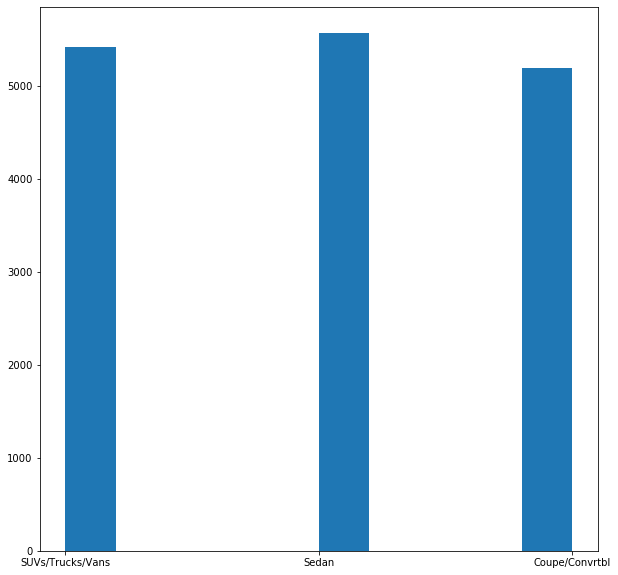

In [60]:
plt.rcParams['figure.figsize'] = [10, 10]
plt.hist(annots["Label1"])

(array([2833.,    0., 5568.,    0.,    0., 5194.,    0., 1514.,    0.,
        1076.]),
 array([0. , 0.4, 0.8, 1.2, 1.6, 2. , 2.4, 2.8, 3.2, 3.6, 4. ]),
 <a list of 10 Patch objects>)

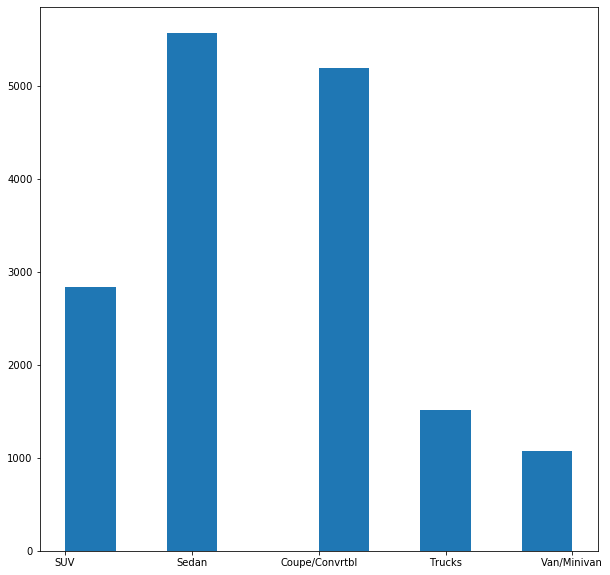

In [61]:
plt.hist(annots["Label2"])

In [62]:
annots.to_csv("../Data/cars_agg_label.csv")